# Rain Prediction Using Decision Tree and Random Forest

## Weather-AUS Dataset: Variable Definitions

| **Variable**           | **Description**                                                                 |
|------------------------|---------------------------------------------------------------------------------|
| **Date**               | The date of the observation (a Date object)                                     |
| **Location**           | Location name of the weather station                                            |
| **MinTemp**            | Minimum temperature (°C)                                                        |
| **MaxTemp**            | Maximum temperature (°C)                                                        |
| **Rainfall**           | Rainfall amount for the day (mm)                                               |
| **Evaporation**        | Class A pan evaporation over 24 h to 9 am (mm)                                 |
| **Sunshine**           | Hours of bright sunshine during the day                                        |
| **WindGustDir**        | Direction of the strongest wind gust in the 24 h to midnight                   |
| **WindGustSpeed**      | Speed of the strongest wind gust (km/h)                                        |
| **Temp9am**            | Temperature at 9 am (°C)                                                        |
| **RelHumid9am**        | Relative humidity at 9 am (%)                                                  |
| **Cloud9am**           | Cloud cover at 9 am (in “oktas”, eighths of sky; 0 = clear, 8 = overcast)     |
| **WindSpeed9am**       | Wind speed averaged over 10 min before 9 am (km/h)                             |
| **Pressure9am**        | Atmospheric pressure reduced to mean sea level at 9 am (hPa)                  |
| **Temp3pm**            | Temperature at 3 pm (°C)                                                        |
| **RelHumid3pm**        | Relative humidity at 3 pm (%)                                                  |
| **Cloud3pm**           | Cloud cover at 3 pm (in oktas; like Cloud9am)                                  |
| **WindSpeed3pm**       | Wind speed averaged over 10 min before 3 pm (km/h)                            |
| **Pressure3pm**        | Atmospheric pressure reduced to mean sea level at 3 pm (hPa)                  |
| **ChangeTemp**         | Change in temperature (°C) compared to previous measurement                   |
| **ChangeTempDir**      | Direction of temperature change (e.g., "Up", "Down")                          |
| **ChangeTempMag**      | Magnitude of temperature change (°C)                                          |
| **ChangeWindDirect**   | Direction change of the wind                                                  |
| **MaxWindPeriod**      | Period during which maximum wind occurred (time window)                       |
| **RainToday**          | Binary: 1 if rainfall in the 24 h to 9 am > 1 mm, else 0                      |
| **TempRange**          | Difference between MaxTemp and MinTemp (°C)                                   |
| **PressureChange**     | Change in atmospheric pressure (hPa) since the prior measurement              |
| **RISK_MM**            | Rainfall amount for "risk" measure (mm)                                       |
| **RainTomorrow**       | Target variable; indicates whether it rained the next day                     |

The dataset contains over **145,000 rows** and **23 columns**.  
The dataset includes **date**, **numeric**, and **categorical** columns.  

Our objective is to create a model to predict the value in the column **`RainTomorrow`**.

### This model will focus on **decision tree** and **random forest**.

## 1) Importing Libraries

In [93]:
import os
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import cross_val_score
import optuna
from sklearn.ensemble import RandomForestClassifier

pd.set_option('display.max_columns', None)

In [4]:
os.chdir('..')

In [5]:
import os
if os.path.exists("Data/weatherAUS.csv"):
    print("File found!")
    raw_df = pd.read_csv("Data/weatherAUS.csv")
else:
    print("File not found. Files in Data folder:")
    if os.path.exists("Data"):
        print(os.listdir("Data"))
    else:
        print("Data folder doesn't exist")

File found!


In [6]:
raw_df = pd.read_csv("Data/weatherAUS.csv")

## 2) Initial Data Inspection

In [7]:
raw_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [8]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [9]:
raw_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [10]:
raw_df.isna().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [11]:
raw_df.dropna(subset=['RainTomorrow'], inplace=True)

## 3) Exploratory Data Analysis

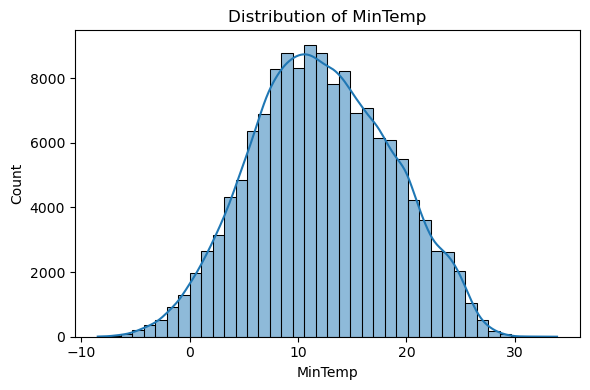

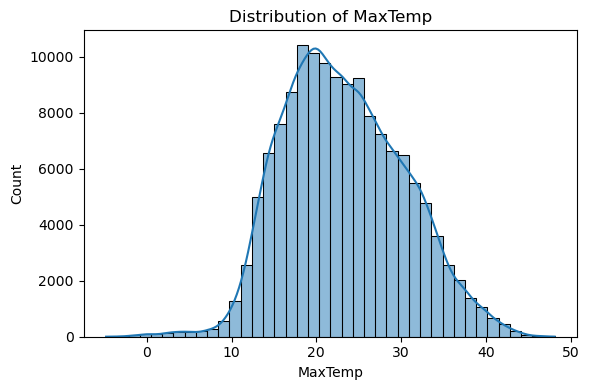

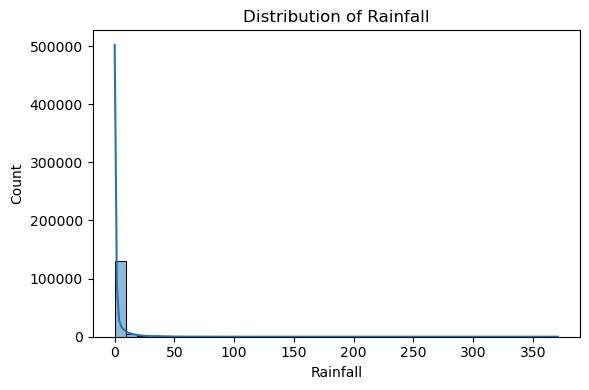

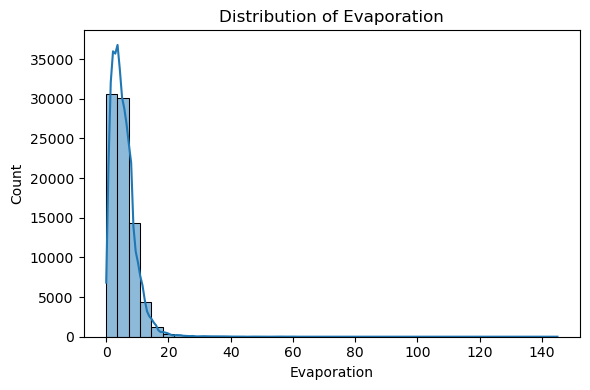

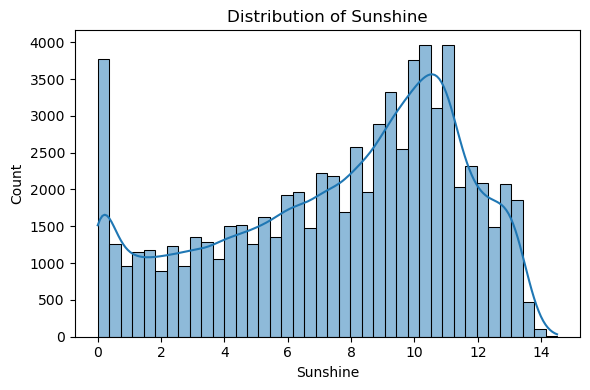

...

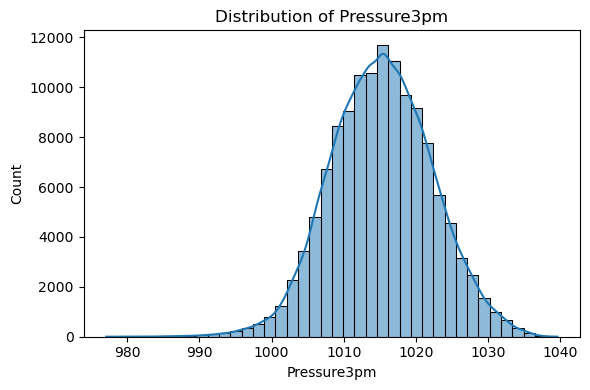

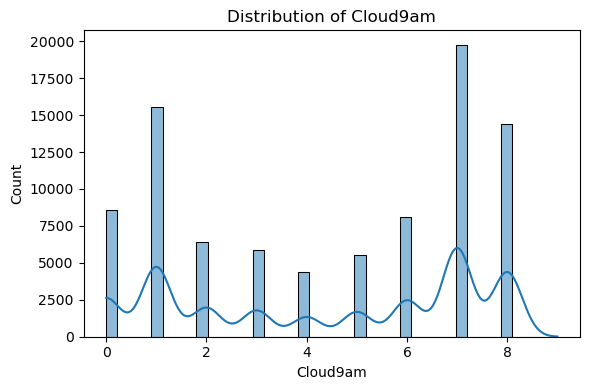

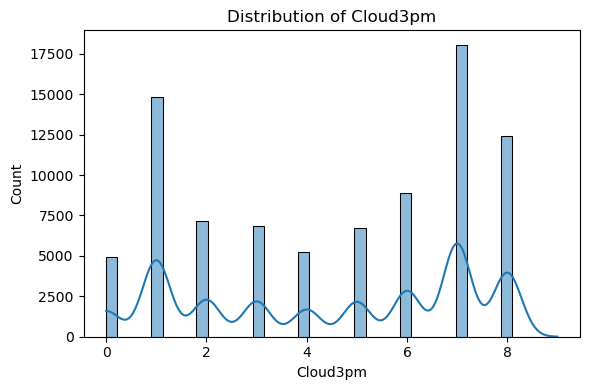

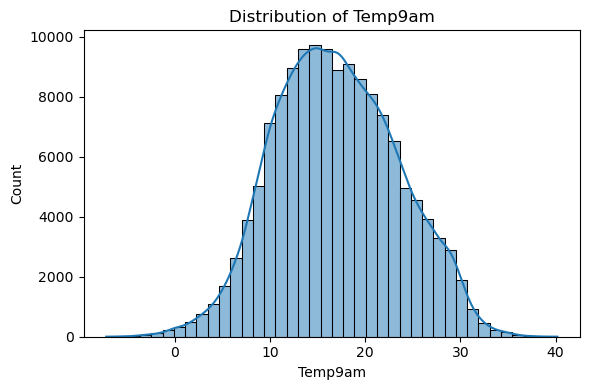

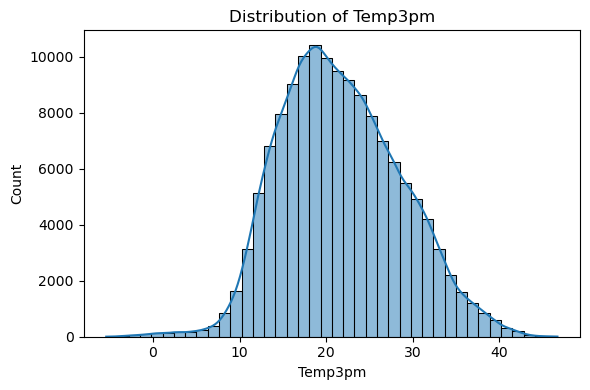

In [12]:
num_cols = raw_df.select_dtypes(include=np.number).columns.tolist()
cat_cols = raw_df.select_dtypes(include='object').columns.tolist()

for col in num_cols:  
    plt.figure(figsize=(6,4))
    sns.histplot(raw_df[col], kde=True, bins=40)
    plt.title(f'Distribution of {col}')
    plt.tight_layout()
    plt.show()

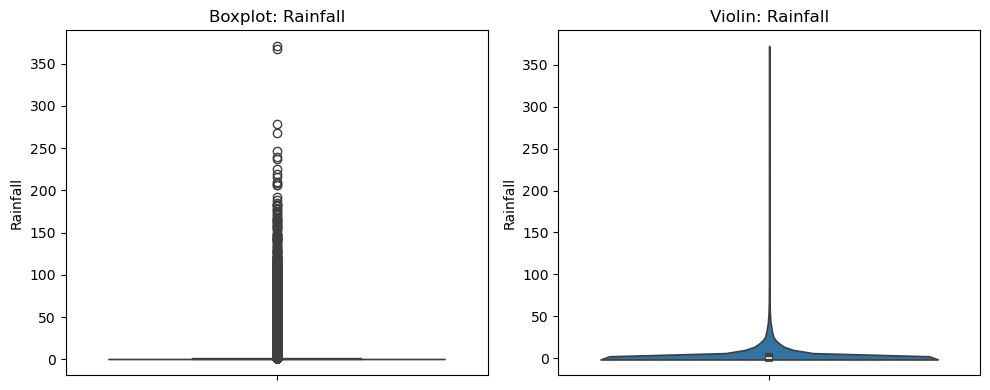

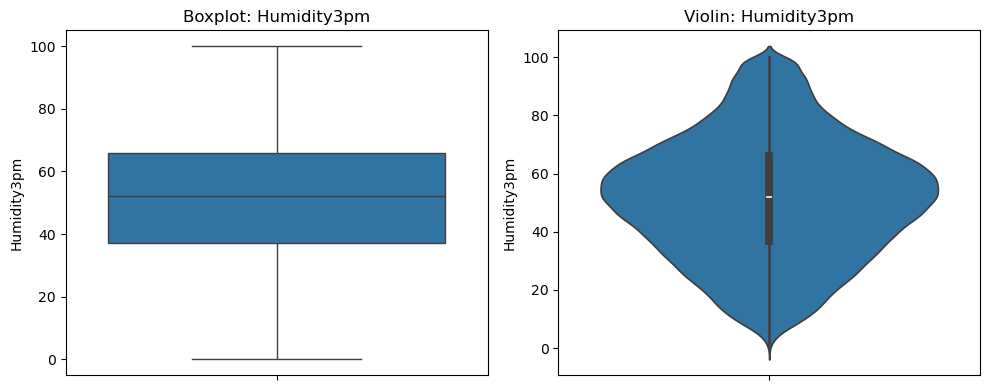

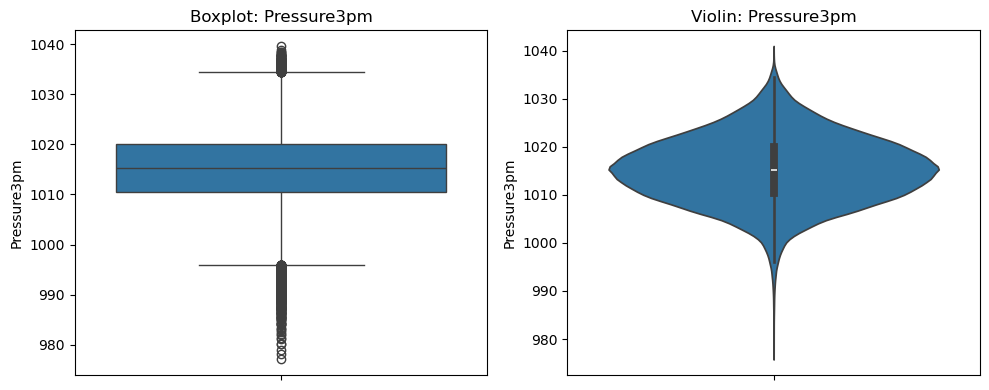

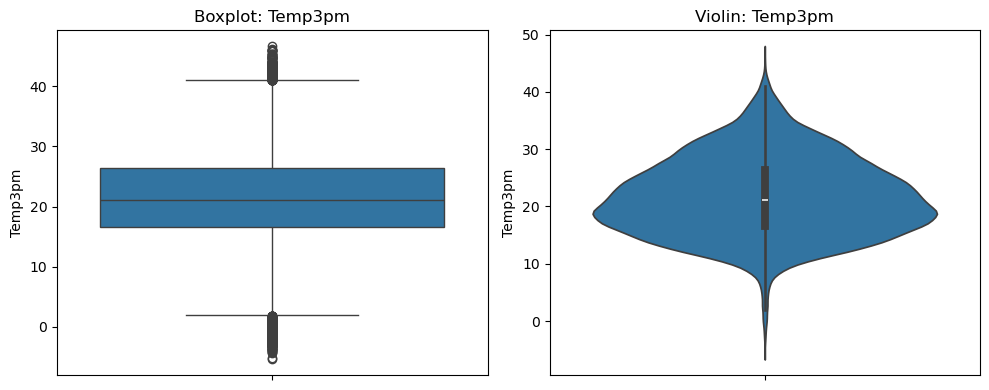

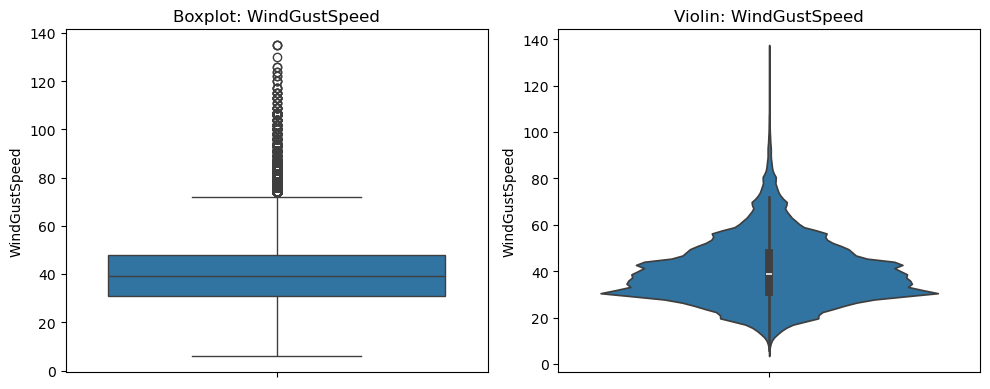

In [13]:
for col in [c for c in ['Rainfall','Humidity3pm','Pressure3pm','Temp3pm','WindGustSpeed'] if c in num_cols]:
    fig, axes = plt.subplots(1,2, figsize=(10,4))
    sns.boxplot(y=raw_df[col], ax=axes[0])
    axes[0].set_title(f'Boxplot: {col}')
    sns.violinplot(y=raw_df[col], ax=axes[1])
    axes[1].set_title(f'Violin: {col}')
    plt.tight_layout()
    plt.show()

In [14]:
# 1. Location vs Rainy Days (colored by RainToday)
fig1 = px.histogram(
    raw_df,
    x='Location',
    color='RainToday',
    title='Location vs. Rainy Days'
)
fig1.show()

fig2 = px.histogram(
    raw_df,
    x='RainTomorrow',
    color='RainToday',
    title='Rain Tomorrow vs Rain Today'
)
fig2.show()

In [15]:
features_3pm = ['Temp3pm', 'WindSpeed3pm', 'Cloud3pm', 'WindSpeed3pm', 'Pressure3pm']

for col in features_3pm:
    if col in raw_df.columns:
        fig = px.histogram(
            raw_df,
            x=col,
            color='RainTomorrow',
            title=f'{col} vs Rain Tomorrow',
            nbins=40
        )
        fig.show()

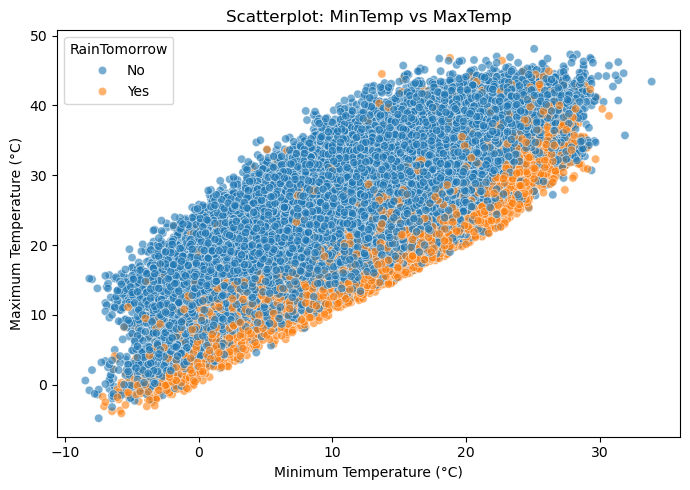

In [16]:
plt.figure(figsize=(7,5))
sns.scatterplot(
    data=raw_df,
    x='MinTemp',
    y='MaxTemp',
    hue='RainTomorrow',  
    alpha=0.6             
)
plt.title('Scatterplot: MinTemp vs MaxTemp')
plt.xlabel('Minimum Temperature (°C)')
plt.ylabel('Maximum Temperature (°C)')
plt.tight_layout()
plt.show()

From the exploratory analysis of the Australian weather dataset, several important patterns emerged:

1. **Target Imbalance**  
   - The majority of days are dry, with only a smaller fraction being rainy.  
   - This confirms that the dataset is **imbalanced**, which should be addressed during modeling (e.g., stratified splits, resampling).

2. **Rainfall Distribution**  
   - Rainfall is highly **skewed**, with most days recording **0 mm**.  
   - A few extreme rainfall events exist, visible as strong outliers.

3. **Temperature Patterns**  
   - `MinTemp` and `MaxTemp` show a **strong positive correlation**.  
   - Rainy days are generally associated with **lower maximum temperatures**, suggesting cooler afternoons when it rains.

4. **Humidity and Pressure**  
   - **High Humidity at 3pm** strongly correlates with rain the following day.  
   - **Low Pressure at 3pm** is another strong indicator of rain, aligning with meteorological expectations.

5. **Categorical Variables**  
   - **RainToday** has a strong relationship with `RainTomorrow`: if it rains today, tomorrow is also more likely to be rainy.  
   - Certain **wind directions** are more often associated with rain (likely linked to coastal vs inland weather patterns).  
   - **Location** also matters: coastal cities tend to have more frequent rain compared to inland locations.

6. **Outliers & Extremes**  
   - Variables such as `Rainfall` and `WindGustSpeed` contain extreme values, reflecting occasional severe weather events.  
   - These are important for model robustness but may require treatment depending on the chosen algorithm.

---

### ✅ Overall Takeaways
- The **most informative predictors** for rain tomorrow are likely to be:
  - **Humidity3pm**,  
  - **Pressure3pm**, and  
  - **RainToday**,  
  with additional signal from wind direction and location.   
- The dataset shows clear **climate-driven patterns**: rainy days tend to be cooler, more humid, and occur more often in coastal regions.

## 4) Data Preparation

### 4.1) Training, Validation, and Test sets

In [17]:
year = pd.to_datetime(raw_df['Date']).dt.year

In [18]:
train_df = raw_df[year < 2015]
val_df = raw_df[year == 2015]
test_df = raw_df[year > 2015]

In [19]:
print(f'Training set shape: {train_df.shape}')
print(f'Validation set shape: {val_df.shape}')  
print(f'Test set shape: {test_df.shape}')

Training set shape: (98988, 23)
Validation set shape: (17231, 23)
Test set shape: (25974, 23)


### 4.2) Input and target columns

In [20]:
input_cols = list(train_df.columns)[1:-1]
target_col = 'RainTomorrow'

In [21]:
train_inputs = train_df[input_cols].copy()
train_target = train_df[target_col].copy()

val_inputs = val_df[input_cols]
val_target = val_df[target_col]

test_inputs = test_df[input_cols]
test_target = test_df[target_col]

In [22]:
num_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()

In [23]:
cat_cols = train_inputs.select_dtypes(include='object').columns.tolist()

### 4.3) Data Imputation and Feature Engineering

In [24]:
imputer = SimpleImputer(strategy='median').fit(train_inputs[num_cols])

for df in (train_inputs, val_inputs, test_inputs):
    df[num_cols] = imputer.transform(df[num_cols])

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\1107365291.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\1107365291.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [25]:
scaler = MinMaxScaler().fit(train_inputs[num_cols])  

for df in (train_inputs, val_inputs, test_inputs):
    df[num_cols] = scaler.transform(df[num_cols])

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\3506543664.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\3506543664.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore').fit(raw_df[cat_cols])

In [27]:
encoded_cols = list(encoder.get_feature_names_out(cat_cols))


In [28]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[cat_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[cat_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[cat_cols])

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\521844835.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\521844835.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\521844835.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.co

In [29]:
test_inputs

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes,RainToday_nan
2498,Albury,0.681604,0.798851,0.000000,0.055825,0.587413,ENE,0.372093,NaN,ESE,0.000000,0.080460,0.46,0.17,0.543802,0.498350,0.777778,0.333333,0.694143,0.816406,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2499,Albury,0.693396,0.722222,0.001078,0.055825,0.587413,SSE,0.341085,SSE,SE,0.103448,0.195402,0.54,0.30,0.505785,0.485149,0.888889,0.888889,0.665944,0.718750,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2500,Albury,0.634434,0.521073,0.005930,0.055825,0.587413,ENE,0.325581,ESE,ENE,0.126437,0.448276,0.62,0.67,0.553719,0.590759,0.888889,0.888889,0.600868,0.480469,Yes,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2501,Albury,0.608491,0.532567,0.042049,0.055825,0.587413,SSE,0.255814,SE,SSE,0.103448,0.195402,0.74,0.65,0.618182,0.618812,0.888889,0.888889,0.544469,0.521484,Yes,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [30]:
X_train = train_inputs[num_cols + encoded_cols]
X_val = val_inputs[num_cols + encoded_cols]
X_test = test_inputs[num_cols + encoded_cols]

In [31]:
train_target

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 98988, dtype: object

In [32]:
sm = SMOTE(random_state=42, n_jobs=-1)
X_train_balanced, y_train = sm.fit_resample(X_train, train_target)

print("After SMOTE (train):")
print(pd.Series(train_target).value_counts())

c:\Users\phunh.DESKTOP-8S8LTG6\anaconda3\Lib\site-packages\imblearn\over_sampling\_smote\base.py:370: FutureWarning:

The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.



After SMOTE (train):
RainTomorrow
No     76705
Yes    22283
Name: count, dtype: int64


## 5) Training Decision Tree Model

### 5.1) Baseline model and Decision tree creation

#### First we need to create a baseline model

In [33]:
dummy_classifier = DummyClassifier(strategy = 'stratified', random_state = 42) 
dummy_classifier.fit(X_train, train_target) 
y_pred = dummy_classifier.predict(X_test)
accuracy = accuracy_score(test_target, y_pred)
print(f"Baseline Model Accuracy: {accuracy:.4f}")

Baseline Model Accuracy: 0.6514


In [34]:
model = DecisionTreeClassifier(random_state=42)
model = model.fit(X_train_balanced, y_train)

In [35]:
train_preds = model.predict(X_train_balanced)

In [36]:
train_preds

array(['No', 'No', 'No', ..., 'Yes', 'Yes', 'Yes'], dtype=object)

In [37]:
accuracy_score(y_train, train_preds)

0.9999869630402191

In [38]:
train_probs = model.predict_proba(X_train_balanced)

In [39]:
train_probs

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [0., 1.]])

In [40]:
model.score(X_val, val_target)

0.7744181997562533

In [41]:
val_target.value_counts() / len(val_target)

RainTomorrow
No     0.788289
Yes    0.211711
Name: count, dtype: float64

#### In this case we can see that there is "overfitting" in the model. This is the case where the model has learned the training examples well but has trouble generalizing to new, unseen data.

In [42]:
model.tree_.max_depth

47

In [43]:
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': model.feature_importances_
}).sort_values(by='Importance', ascending=False)

importance_df.head(15)


,Feature,Importance
9,Humidity3pm,0.309507
5,WindGustSpeed,0.076835
4,Sunshine,0.068631
2,Rainfall,0.067418
11,Pressure3pm,0.056504
13,Cloud3pm,0.042208
8,Humidity9am,0.028330
7,WindSpeed3pm,0.027163
15,Temp3pm,0.022462
6,WindSpeed9am,0.022348


C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\3715777108.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




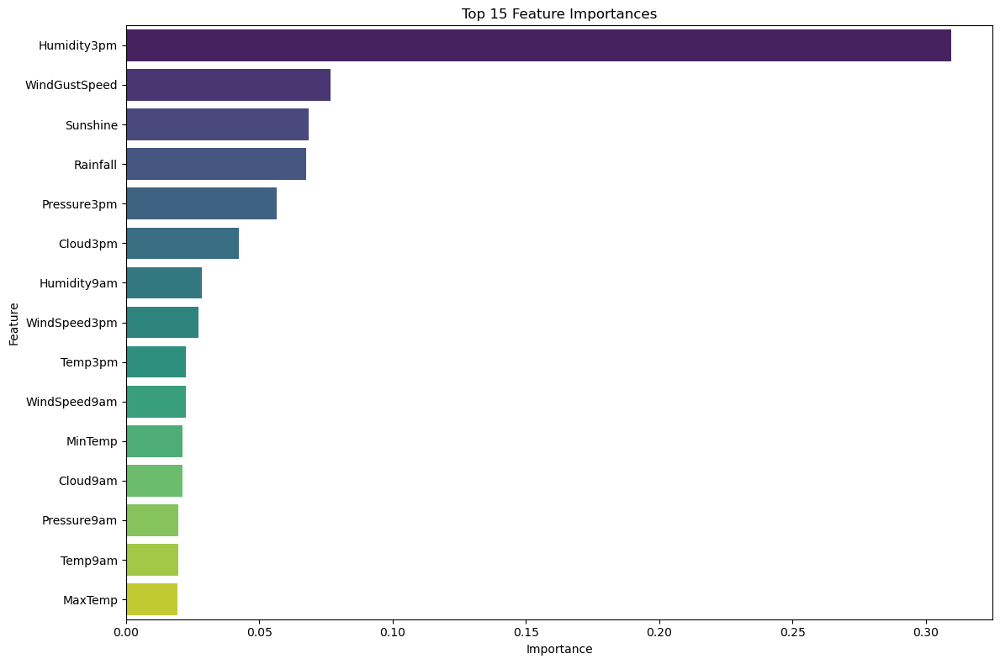

In [44]:
plt.figure(figsize=(12,8))
sns.barplot(data=importance_df.head(15), x='Importance', y='Feature', palette='viridis')
plt.title('Top 15 Feature Importances')
plt.tight_layout()
plt.show()

### 5.2) Hyperparameter Tuning and Overfitting

Hyperparameters we will be exploring is: **max_depth** and **max_leaf_nodes**

**max_depth**

In [45]:
model = DecisionTreeClassifier(max_depth=3, random_state=42)


In [46]:
model.fit(X_train_balanced, y_train)

DecisionTreeClassifier(max_depth=3, random_state=42)

In [47]:
model.score(X_train_balanced, y_train)

0.7628251091845382

In [48]:
model.score(X_val, val_target)

0.8021008647205617

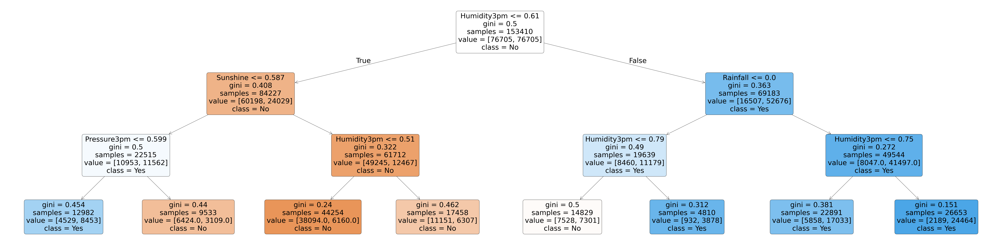

In [49]:
plt.figure(figsize=(80,20))
plot_tree(model, feature_names=X_train_balanced.columns, class_names=model.classes_, filled=True, rounded=True)
plt.tight_layout()
plt.show()

In [50]:
def max_depth_accuracy(md):
    model = DecisionTreeClassifier(max_depth=md, random_state=42)
    model.fit(X_train_balanced, y_train)
    train_acc = model.score(X_train_balanced, y_train)
    val_acc = model.score(X_val, val_target)
    return {'Max Depth': md, 'Training error': train_acc, 'Validation error':val_acc}

In [51]:
errors_df = pd.DataFrame([max_depth_accuracy(md) for md in range(1, 21)])

In [52]:
errors_df.sort_values(by='Validation error', ascending=False)

,Max Depth,Training error,Validation error
11,12,0.861000,0.822761
10,11,0.848660,0.820498
9,10,0.837788,0.819511
8,9,0.826556,0.818641
7,8,0.817548,0.817074
13,14,0.883938,0.815565
12,13,0.872681,0.814056
6,7,0.805788,0.810574
15,16,0.908963,0.809645
5,6,0.795222,0.809355


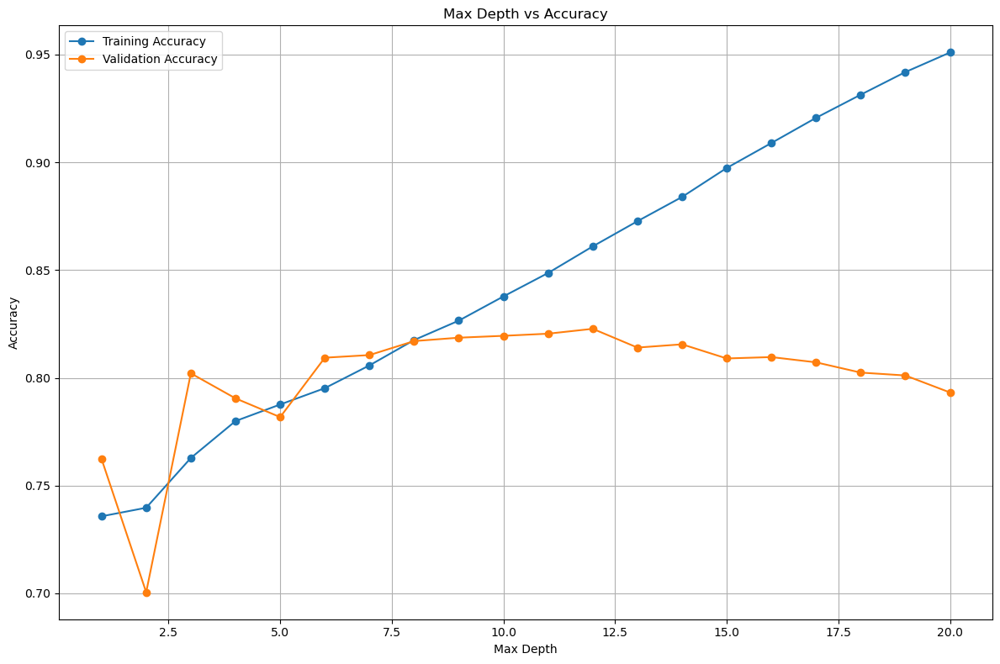

In [53]:
plt.figure(figsize=(12,8))
plt.plot(errors_df['Max Depth'], errors_df['Training error'], marker='o', label='Training Accuracy')
plt.plot(errors_df['Max Depth'], errors_df['Validation error'], marker='o', label='Validation Accuracy')
plt.xlabel('Max Depth')
plt.ylabel('Accuracy')
plt.title('Max Depth vs Accuracy')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

**max_leaf_nodes**

In [54]:
model = DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [55]:
model.fit(X_train_balanced,y_train)

DecisionTreeClassifier(max_leaf_nodes=128, random_state=42)

In [56]:
model.score(X_train_balanced,y_train)

0.8220585359494166

In [57]:
model.score(X_val, val_target)

0.8159712146712321

In [58]:
model = DecisionTreeClassifier(max_leaf_nodes=110, random_state=42)

In [59]:
model.fit(X_train_balanced, y_train)

DecisionTreeClassifier(max_leaf_nodes=110, random_state=42)

In [60]:
model.score(X_train_balanced, y_train), model.score(X_val, val_target)

(0.8192295156769441, 0.8142301665602693)

In [61]:
model.tree_.max_depth

12

finding best **max_depth** and **max_leaf_nodes**

In [62]:
POS_LABEL = "Yes"

In [63]:
def eval_depth(md, *, max_leaf_nodes=None):
    model = DecisionTreeClassifier(
        max_depth=md,
        max_leaf_nodes=max_leaf_nodes,
        random_state=42,
        class_weight="balanced"  # helpful for imbalance; remove if you don't want it
    )
    model.fit(X_train_balanced, y_train)

    # Training metrics
    yhat_tr = model.predict(X_train_balanced)
    train_acc = accuracy_score(y_train, yhat_tr)
    train_prec = precision_score(y_train, yhat_tr, pos_label=POS_LABEL, zero_division=0)
    train_rec  = recall_score(y_train, yhat_tr,  pos_label=POS_LABEL, zero_division=0)
    train_f1   = f1_score(y_train, yhat_tr,      pos_label=POS_LABEL, zero_division=0)

    # Validation metrics
    yhat_va = model.predict(X_val)
    val_acc = accuracy_score(val_target, yhat_va)
    val_prec = precision_score(val_target, yhat_va, pos_label=POS_LABEL, zero_division=0)
    val_rec  = recall_score(val_target, yhat_va,  pos_label=POS_LABEL, zero_division=0)
    val_f1   = f1_score(val_target, yhat_va,      pos_label=POS_LABEL, zero_division=0)

    return {
        "Max Depth": md,
        "Max Leaf Nodes": max_leaf_nodes if max_leaf_nodes is not None else np.nan,
        "Train Acc": train_acc, "Train Prec": train_prec, "Train Rec": train_rec, "Train F1": train_f1,
        "Val Acc": val_acc,     "Val Prec": val_prec,     "Val Rec": val_rec,     "Val F1": val_f1,
    }


In [64]:
depth_grid = [5, 8, 10, 12, 14, 16, 18, None]      
leaf_grid  = [None, 16, 32, 64, 128, 256]          

rows = []
for md in depth_grid:
    for ml in leaf_grid:
        rows.append(eval_depth(md, max_leaf_nodes=ml))

grid_df = (pd.DataFrame(rows)
           .sort_values(by=["Val F1", "Val Rec", "Val Prec"], ascending=False))
grid_df.head(15)

,Max Depth,Max Leaf Nodes,Train Acc,Train Prec,Train Rec,Train F1,Val Acc,Val Prec,Val Rec,Val F1
41,18.0,256.0,0.837005,0.853974,0.813037,0.833003,0.824502,0.578748,0.628564,0.602628
47,NaN,256.0,0.837005,0.853974,0.813037,0.833003,0.824502,0.578748,0.628564,0.602628
35,16.0,256.0,0.837051,0.853397,0.813923,0.833193,0.824270,0.578046,0.629386,0.602625
23,12.0,256.0,0.835467,0.852880,0.810795,0.831305,0.823690,0.576518,0.629934,0.602043
22,12.0,128.0,0.822059,0.835313,0.802295,0.818471,0.815971,0.555478,0.654605,0.600982
28,14.0,128.0,0.822059,0.835313,0.802295,0.818471,0.815971,0.555478,0.654605,0.600982
34,16.0,128.0,0.822059,0.835313,0.802295,0.818471,0.815971,0.555478,0.654605,0.600982
40,18.0,128.0,0.822059,0.835313,0.802295,0.818471,0.815971,0.555478,0.654605,0.600982
46,NaN,128.0,0.822059,0.835313,0.802295,0.818471,0.815971,0.555478,0.654605,0.600982
17,10.0,256.0,0.830239,0.843332,0.811173,0.826940,0.818119,0.561249,0.645559,0.600459


In [65]:
grid_df.sort_values(by=["Val Rec"], ascending=False).head(15)

,Max Depth,Max Leaf Nodes,Train Acc,Train Prec,Train Rec,Train F1,Val Acc,Val Prec,Val Rec,Val F1
13,10.0,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
31,16.0,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
37,18.0,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
19,12.0,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
43,NaN,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
25,14.0,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
7,8.0,16.0,0.779630,0.777722,0.783065,0.780384,0.779641,0.485818,0.699561,0.573419
2,5.0,32.0,0.787647,0.782473,0.796806,0.789575,0.781789,0.489260,0.699287,0.575717
0,5.0,NaN,0.787647,0.782473,0.796806,0.789575,0.781789,0.489260,0.699287,0.575717
3,5.0,64.0,0.787647,0.782473,0.796806,0.789575,0.781789,0.489260,0.699287,0.575717


In [66]:
def evaluate_model(model, X, y, threshold=0.5):
    """
    Simple evaluation of a classifier:
    prints Accuracy, Precision, Recall, F1,
    and shows a confusion matrix.
    """
    # Probabilities -> class predictions
    y_proba = model.predict_proba(X)[:, 1]
    y_pred = (y_proba >= threshold).astype(int)

    # If labels are strings ("Yes"/"No"), convert to 0/1
    y_true = (y == POS_LABEL).astype(int)

    # Metrics
    acc  = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec  = recall_score(y_true, y_pred, zero_division=0)
    f1   = f1_score(y_true, y_pred, zero_division=0)

    print(f"Accuracy : {acc:.3f}")
    print(f"Precision: {prec:.3f}")
    print(f"Recall   : {rec:.3f}")
    print(f"F1 Score : {f1:.3f}")

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.imshow(cm, cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    for (i, j), v in np.ndenumerate(cm):
        plt.text(j, i, str(v), ha="center", va="center", color="red")
    plt.show()

In [94]:
def plot_roc_pr_curves(model, X, y, pos_label=1):
    """Plot ROC and Precision-Recall curves."""
    # Probabilities for positive class
    y_proba = model.predict_proba(X)[:, 1]
    y_true = (y == pos_label).astype(int)

    # --- ROC Curve ---
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    roc_auc = auc(fpr, tpr)

    # --- Precision–Recall Curve ---
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = average_precision_score(y_true, y_proba)

    # --- Plot both ---
    plt.figure(figsize=(12,5))

    # ROC
    plt.subplot(1,2,1)
    plt.plot(fpr, tpr, label=f"ROC AUC = {roc_auc:.3f}")
    plt.plot([0,1],[0,1],"--",color="gray")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve")
    plt.legend()

    # PR
    plt.subplot(1,2,2)
    plt.plot(recall, precision, label=f"PR AUC = {pr_auc:.3f}", color="orange")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision–Recall Curve")
    plt.legend()

    plt.tight_layout()
    plt.show()

    print(f"ROC-AUC : {roc_auc:.3f}")
    print(f"PR-AUC  : {pr_auc:.3f}")

In [67]:
final_model = DecisionTreeClassifier(
    max_depth=18,
    max_leaf_nodes=256,
    random_state=42,
    class_weight="balanced"   
)

final_model.fit(X_train_balanced, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=18,
                       max_leaf_nodes=256, random_state=42)

Final Test Evaluation — Decision Tree
Accuracy : 0.807
Precision: 0.569
Recall   : 0.652
F1 Score : 0.608


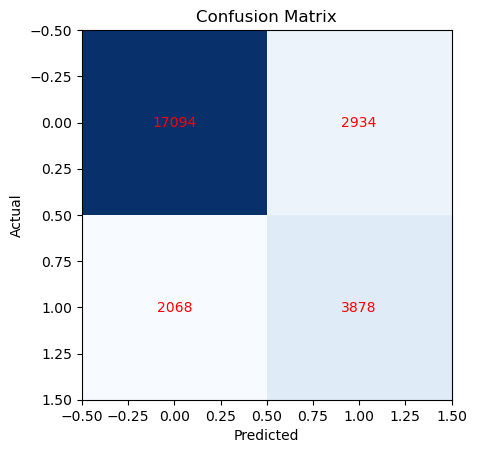

In [68]:
print("Final Test Evaluation — Decision Tree")
evaluate_model(final_model, X_test, test_target, threshold=0.5)

## Final Test Evaluation — Decision Tree (max_depth=18, max_leaf_nodes=256)

After selecting hyperparameters on the validation set, the final Decision Tree model was evaluated **once** on the unseen test set.  
The results are:

- **Accuracy**: 0.807  
- **Precision (Rain=Yes)**: 0.569  
- **Recall (Rain=Yes)**: 0.652  
- **F1 Score (Rain=Yes)**: 0.608  

### Interpretation of Results
- **Accuracy (81%)** appears strong, but since the dataset is imbalanced (most days = "No rain"), accuracy alone is not a reliable metric.  
- **Recall (65%)** means the model correctly identified about **2 out of 3 rainy days**. This is crucial because missing a rainy day is often costlier than a false alarm.  
- **Precision (57%)** means that when the model predicts rain, it is correct a little more than half of the time. This indicates some false alarms, but still provides actionable signals.  
- **F1 Score (61%)** balances precision and recall, showing the model has reasonable performance given the challenge of predicting daily rainfall.

### Is this acceptable?
Yes. These scores are consistent with expectations for the weatherAUS dataset, which is noisy and imbalanced. For a baseline Decision Tree model, achieving **~65% recall** with **~57% precision** is a solid result.  

The key takeaway is that the model is **better than naive baselines** (e.g., always predicting "No rain") and provides useful predictive power, though there is room for improvement.

### Next Steps
To further improve performance:
1. **Threshold tuning**: Adjust the decision threshold to increase recall (e.g., target ≥80% rainy-day recall), while monitoring the trade-off in precision.  
2. **Ensemble methods**: Apply **Random Forest** or **Gradient Boosting** to improve generalization and lift both precision and recall.  
3. **Feature engineering**: Add seasonal features (`Month`, `Season`), location effects, and lagged rainfall indicators (`Rainfall_lag1`, `Rainfall_lag2`) to capture temporal/weather patterns.  
4. **Model comparison**: Evaluate the Decision Tree against more advanced models to quantify improvements.  

---

**Summary:**  
The final Decision Tree baseline achieved **81% accuracy, 57% precision, 65% recall, and 61% F1** on the test set.  
This provides a reasonable starting point for rainfall prediction, highlighting the difficulty of the task and setting a baseline for future improvements with ensembles and feature engineering.

## Random Forest Model 

In [69]:
from sklearn.ensemble import RandomForestClassifier

In [70]:
model2 = RandomForestClassifier(n_jobs= -1, random_state=42)

In [71]:
model2.fit(X_train_balanced, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [72]:
model2.score(X_train_balanced, y_train)

0.9999804445603285

In [73]:
model2.score(X_val, val_target)

0.850734141953456

In [74]:
importance_df_2 = pd.DataFrame({
    'Feature': X_train_balanced.columns, 
    'Importance': model2.feature_importances_
}).sort_values(by='Importance', ascending=False)



In [75]:
importance_df_2.head(10)

,Feature,Importance
9,Humidity3pm,0.124313
2,Rainfall,0.076478
4,Sunshine,0.060045
13,Cloud3pm,0.059934
5,WindGustSpeed,0.048820
8,Humidity9am,0.048359
11,Pressure3pm,0.045971
10,Pressure9am,0.040620
12,Cloud9am,0.038857
15,Temp3pm,0.034574


C:\Users\phunh.DESKTOP-8S8LTG6\AppData\Local\Temp\ipykernel_15000\709830749.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




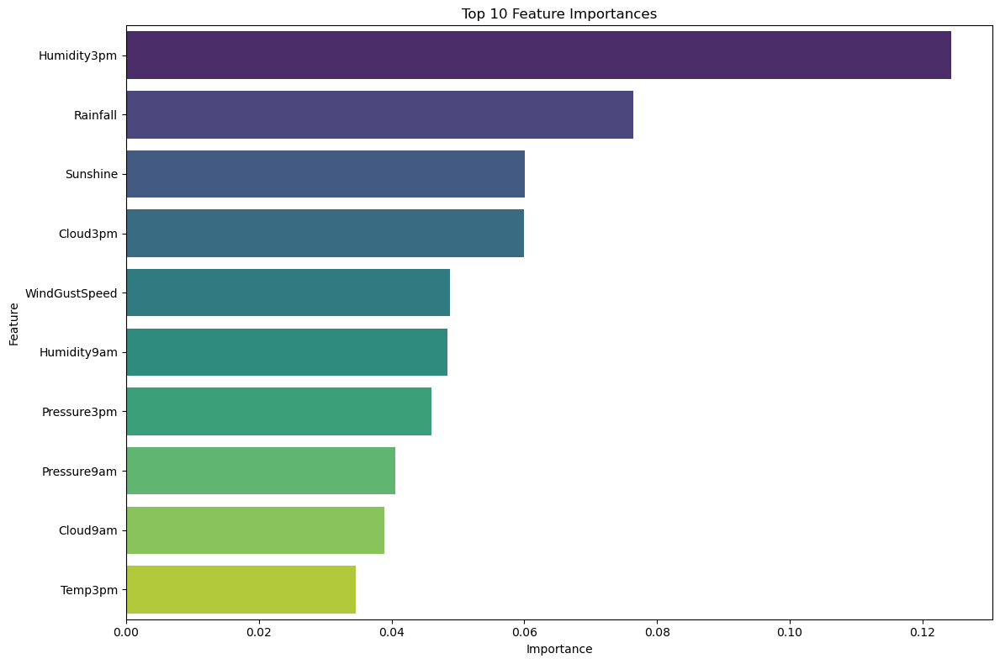

In [76]:
plt.figure(figsize=(12,8))
sns.barplot(data=importance_df_2.head(10), x='Importance', y='Feature', palette='viridis')
plt.title('Top 10 Feature Importances')
plt.tight_layout()
plt.show()

### Hyperparameter tuning for random forest

In [77]:
base_model = RandomForestClassifier(random_state=42, n_jobs=-1)


In [78]:
base_model.fit(X_train_balanced, y_train)   

RandomForestClassifier(n_jobs=-1, random_state=42)

Accuracy : 1.000
Precision: 1.000
Recall   : 1.000
F1 Score : 1.000


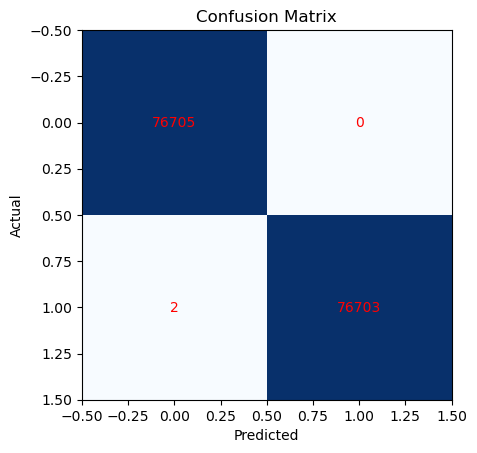

In [79]:
evaluate_model(base_model, X_train_balanced, y_train, threshold=0.5)

Accuracy : 0.849
Precision: 0.653
Recall   : 0.614
F1 Score : 0.633


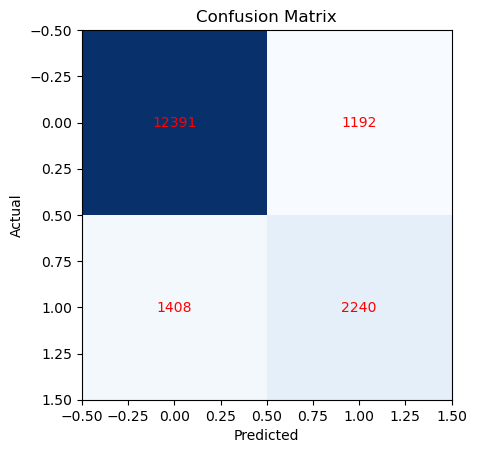

In [80]:
evaluate_model(base_model, X_val, val_target, threshold=0.5)    

#### 10 estimators

In [81]:
model = RandomForestClassifier(random_state=42, n_jobs=-1, n_estimators=10)

In [82]:
model.fit(X_train_balanced, y_train)

RandomForestClassifier(n_estimators=10, n_jobs=-1, random_state=42)

Accuracy : 0.994
Precision: 0.991
Recall   : 0.998
F1 Score : 0.994


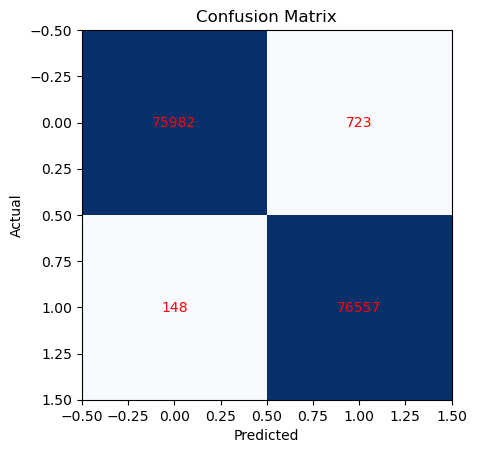

In [83]:
evaluate_model(model, X_train_balanced, y_train, threshold=0.5)

Accuracy : 0.822
Precision: 0.571
Recall   : 0.643
F1 Score : 0.605


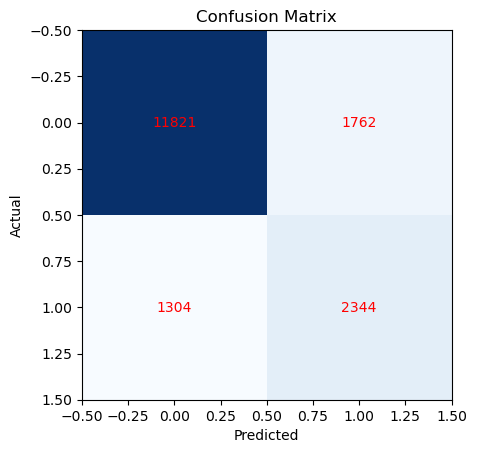

In [84]:
evaluate_model(model, X_val, val_target, threshold=0.5)

#### 500 estimators

In [85]:
model = RandomForestClassifier(random_state=42, n_jobs=-1, n_estimators=500)
model.fit(X_train_balanced, y_train)

RandomForestClassifier(n_estimators=500, n_jobs=-1, random_state=42)

Accuracy : 1.000
Precision: 1.000
Recall   : 1.000
F1 Score : 1.000


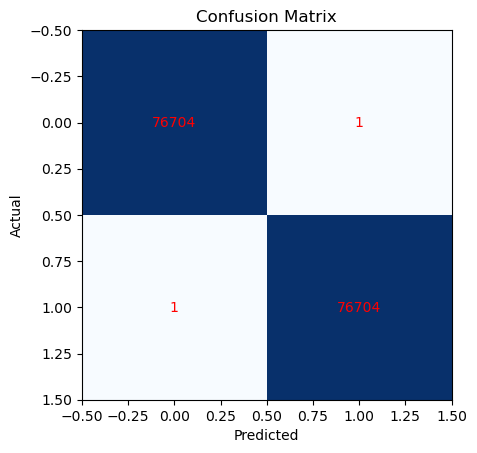

In [86]:
evaluate_model(model, X_train_balanced, y_train, threshold=0.5)

Accuracy : 0.850
Precision: 0.658
Recall   : 0.606
F1 Score : 0.631


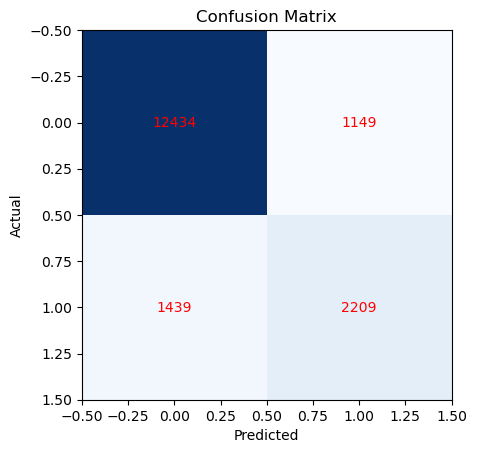

In [87]:
evaluate_model(model, X_val, val_target, threshold=0.5)

### Lets tune the hyper parameters for random forest

In [ ]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 800),
        "max_depth": trial.suggest_int("max_depth", 4, 20),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 5),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", 0.5]),
        "bootstrap": trial.suggest_categorical("bootstrap", [True, False]),
        "class_weight": trial.suggest_categorical("class_weight", ["balanced", None]),
        "ccp_alpha": trial.suggest_float("ccp_alpha", 0.0, 0.005),
        "random_state": 42,
        "n_jobs": -1,
    }

    model = RandomForestClassifier(**params)

    score = cross_val_score(
        model,
        X_train_balanced,  
        y_train,
        cv=3,
        scoring="roc_auc",
        n_jobs=-1
    ).mean()

    return score


study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10, n_jobs=1)  

print("Best ROC-AUC:", study.best_value)
print("Best Hyperparameters:")
for key, value in study.best_params.items():
    print(f"  {key}: {value}")

[I 2025-10-09 13:41:12,849] A new study created in memory with name: no-name-268b1cc9-d20a-4712-8099-0c585c3402d3
[I 2025-10-09 13:42:40,693] Trial 0 finished with value: 0.8253416737143145 and parameters: {'n_estimators': 786, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 4, 'max_features': 'log2', 'bootstrap': True, 'class_weight': None, 'ccp_alpha': 0.0022127649341050232}. Best is trial 0 with value: 0.8253416737143145.
[I 2025-10-09 13:59:24,346] Trial 1 finished with value: 0.8034725818207199 and parameters: {'n_estimators': 713, 'max_depth': 15, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 0.5, 'bootstrap': True, 'class_weight': 'balanced', 'ccp_alpha': 0.0009704497121172106}. Best is trial 0 with value: 0.8253416737143145.
[I 2025-10-09 14:03:11,435] Trial 2 finished with value: 0.8595114331945201 and parameters: {'n_estimators': 669, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_features': 0.5, 'bootstrap': True, 'class_wei

Best ROC-AUC: 0.8595114331945201
Best Hyperparameters:
  n_estimators: 669
  max_depth: 4
  min_samples_split: 9
  min_samples_leaf: 3
  max_features: 0.5
  bootstrap: True
  class_weight: balanced
  ccp_alpha: 0.0018938314487647106


In [90]:
best_params = {
    "n_estimators": 669,
    "max_depth": 4,
    "min_samples_split": 9,
    "min_samples_leaf": 3,
    "max_features": 0.5,
    "bootstrap": True,
    "class_weight": "balanced",
    "ccp_alpha": 0.0018938314487647106,
    "random_state": 42,
    "n_jobs": -1
}

final_model = RandomForestClassifier(**best_params)
final_model.fit(X_train_balanced, y_train)

RandomForestClassifier(ccp_alpha=0.0018938314487647106, class_weight='balanced',
                       max_depth=4, max_features=0.5, min_samples_leaf=3,
                       min_samples_split=9, n_estimators=669, n_jobs=-1,
                       random_state=42)

Accuracy : 0.796
Precision: 0.800
Recall   : 0.789
F1 Score : 0.794


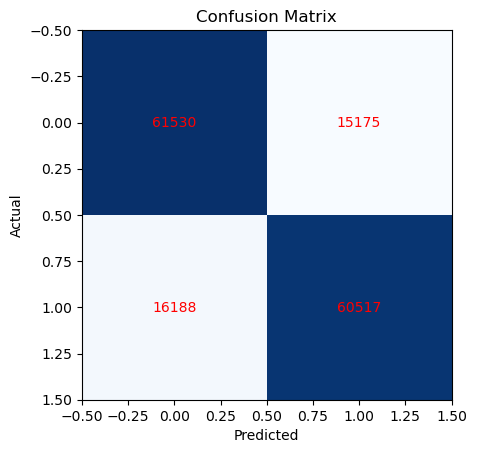

In [91]:
evaluate_model(final_model, X_train_balanced, y_train, threshold=0.5)

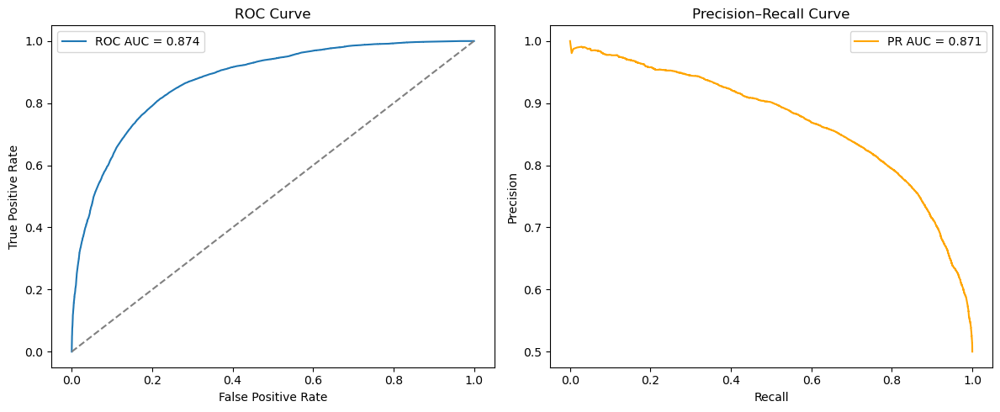

ROC-AUC : 0.874
PR-AUC  : 0.871


In [95]:
plot_roc_pr_curves(final_model, X_train_balanced, y_train, pos_label=POS_LABEL)

### 🧾 Training Set Evaluation Summary

| **Metric** | **Value** | **Interpretation** |
|:------------|:----------|:------------------|
| **Accuracy** | 0.796 | The model correctly predicts about 80% of cases. |
| **Precision** | 0.800 | 80% of predicted rain days were actually rainy. |
| **Recall** | 0.789 | The model detects about 79% of real rainy days. |
| **F1 Score** | 0.794 | Good overall balance between precision and recall. |
| **ROC-AUC** | 0.874 | Strong ability to distinguish rainy vs. non-rainy days. |
| **PR-AUC** | 0.871 | Maintains good precision even under class imbalance. |

---

### 💬 Comments

The Random Forest model performs well on the training set, showing **strong discriminative ability** (AUC ≈ 0.87) and **balanced precision–recall performance**.  
There are **no major signs of overfitting**, but results should be verified on the **validation and test sets** to confirm generalization.








Accuracy : 0.793
Precision: 0.508
Recall   : 0.675
F1 Score : 0.580


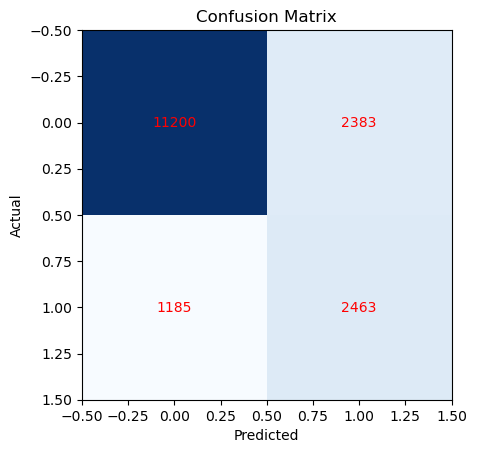

In [96]:
evaluate_model(final_model, X_val, val_target, threshold=0.5)


Threshold = 0.5
Accuracy : 0.793
Precision: 0.508
Recall   : 0.675
F1 Score : 0.580


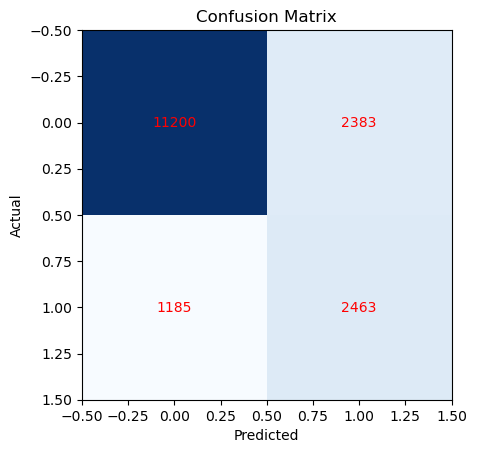


Threshold = 0.45
Accuracy : 0.768
Precision: 0.470
Recall   : 0.726
F1 Score : 0.570


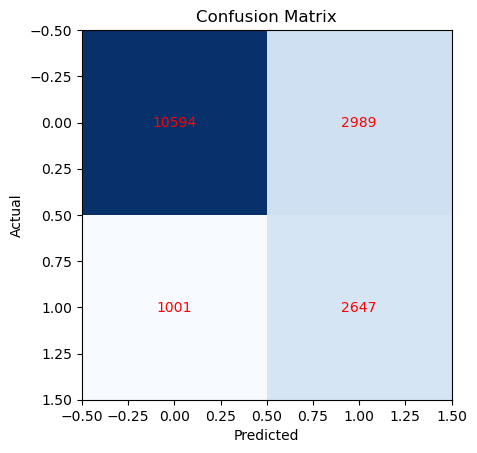


Threshold = 0.4
Accuracy : 0.734
Precision: 0.430
Recall   : 0.788
F1 Score : 0.556


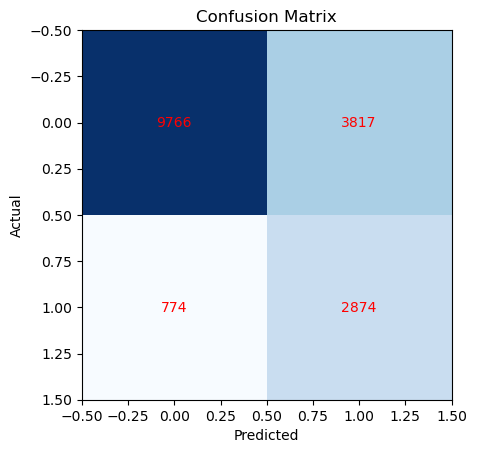


Threshold = 0.35
Accuracy : 0.703
Precision: 0.402
Recall   : 0.830
F1 Score : 0.542


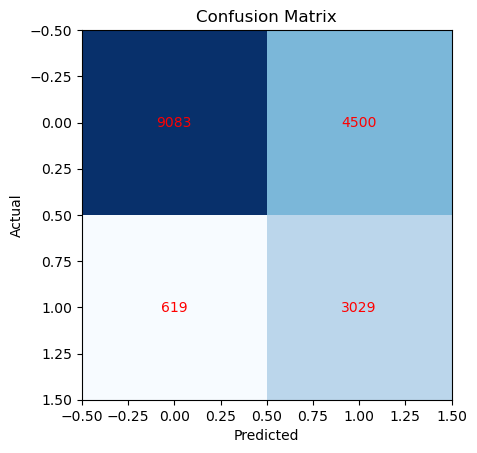

In [97]:
for t in [0.5, 0.45, 0.4, 0.35]:
    print(f"\nThreshold = {t}")
    evaluate_model(final_model, X_val, val_target, threshold=t)

### I want to prioritize recall so lets so with 0.35 as our threshold

Accuracy : 0.683
Precision: 0.404
Recall   : 0.813
F1 Score : 0.540


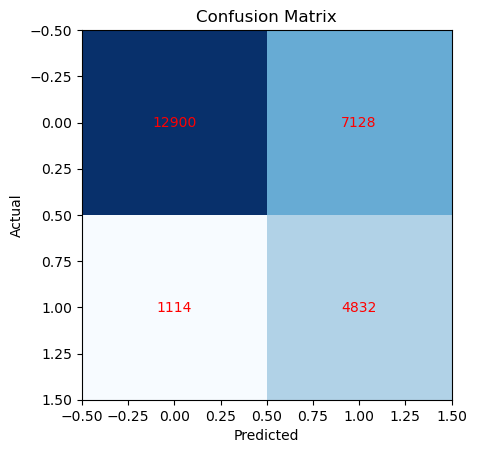

In [101]:
evaluate_model(final_model, X_test, test_target, threshold=0.35)

### 🌧️ Test Set Evaluation Summary

| **Metric** | **Value** | **Interpretation** |
|:------------|:-----------|:------------------|
| **Accuracy** | 0.683 | About 68% of predictions were correct — slightly lower due to more false positives. |
| **Precision** | 0.404 | Only 40% of predicted rainy days were actually rainy — model overpredicts rain. |
| **Recall** | 0.813 | Captures around 81% of actual rainy days — strong sensitivity. |
| **F1 Score** | 0.540 | Moderate balance between detecting rain and avoiding false alarms. |

---

### 💬 Comments

The model performs **reasonably well** in identifying rainy days (high recall), but **precision drops**, meaning many “rain” predictions are false alarms.  
This behavior is expected when training with **SMOTE** and lowering the threshold (0.35), which increases recall at the cost of precision.  
Overall, the model is **good at catching rain events** but could be **further tuned** for fewer false positives.